# Tutorial on the RUS equations (Rayleigh-Ritz method in code)

Show the tools in that RUS toolbox through a worked example.  This notebook is for learning purposes, therefore you will see lots of visualizations.

# Example: Kiwifruit elastic parameters

The following codes were adapted from the codes of the [PALab](https://github.com/PALab) for [RUS](https://github.com/PALab/RUS). These codes were provided by Zadler et al. (2004) and translated to Python by [Paul Freeman](https://github.com/paul-freeman) in 2015. The functions needed are in the file `rus_tools.py`.  The formula for the spheroid in Zadler et al. (2004) has a typo on the multiplying factor (it should be $\pi/2$ instead of $4\pi$!).

The eigenvalues are related to the resonant frequencies of the object!!!

> **Remember to shutdown the kernel and restarting it to clear the memoization global variables before a new run!!!**

The cell below is an example of a typical forward model: given the elastic parameters and shape of an object, calculate its normal mode frequencies and, if needed, the displacements at a given location on or within it.

In [1]:
# Download a data file from github, if it doesn't exist
!test ! -f rus_tools.py && wget 'https://raw.githubusercontent.com/edur409/Circumferential-Surface-Waves/main/RUS/rus_tools.py'

In [2]:
%%time
import sys
import scipy
import numpy
import matplotlib.pyplot as plt
import scipy.linalg.lapack as lapack
import scipy.linalg as la
from math import sqrt
import rus_tools as rus

def c_l(lam, mu, rho):
    return 1000*numpy.sqrt((lam + 2*mu)/rho)

def c_t(mu, rho):
    return 1000*numpy.sqrt(mu/rho)

def Lambda(E, nu):
    return E*nu/((1 + nu)*(1 - 2*nu))

def G(E, nu):
    return E/(2*(1 + nu))

E = 4.3*1e-3 # GPa Kiwifruit
nu = 0.4997

# Inputs
# Aluminium: Lam: 53.0989  , Mu: 26.0 , Rho: 2.710
# Copper: Lam: 105.6 GPa, Mu: 48.3 GPa, Rho: 8.933 g/cm^3
Lam = Lambda(E, nu)#105.6 # GPa 53.0989#
Mu = G(E, nu)#48.3 # GPa 26.7195
rho = 1.100 #8.933 # cm^3 2.710 #

print('Vp: ', c_l(Lam, Mu, rho))
print('Vs: ', c_t(Mu, rho))

# Shape of object and dimensions
shape = 2 # 1 for cylinder.  2 for a sphere
args = {'nfreq': 100, 'outeigen': None}
a = {'c11': Lam + 2*Mu, 'c44': Mu}
dimension1 = 5.00/2 #2.5 # Radius 1 4.422/2 #
dimension2 = 5.00/2 #4.70/2#2.5 # Radius 2 4.422/2 #
dimension3 = 6.5/2 #3.8 # Radius 3  # Use this: 150.0e4 and cylinder shape = 1 for infinite cylinder #6.414/2 #
dimensions = [dimension1, dimension2, dimension3]
print('2*dimension1:', 2*dimension1)
print('2*dimension2:', 2*dimension2)
print('2*dimension3:', 2*dimension3)

# Elastic matrix and stiffness tensor
cm = rus.make_cm(a, hextype=None) # Voigt notation 6X6 array

cijkl = rus.stiffness(cm) # Full tensor 3x3x3x3 array
print('Stress tensor: ',cm)
# print('DATA C/ ',cijkl.reshape(81, order='F')) # Vissher et al. (1991) Fortran code for Cijkl

# Code starts
d = 8 # N order or NN in Vissher et al. 1991
problem_size = int(3*(d + 1)*(d + 2)*(d + 3)/6) # R in Vissher et al. 1991

tabs, irk = rus.index_relationship(d, problem_size)

e = rus.e_fill(tabs, dimensions, rho, shape, irk)

gamma = rus.gamma_fill(tabs, dimensions, cm, shape, irk)

print("done preparing matrices") # It works find until here

jobz = 'N'
if args['outeigen'] == None: #args.outeigen == None:
    jobz = 'N'
else:
    jobz = 'V'

# Solves the eigenproblem for each block of the block-diagonal matrix Gamma
# Each matrix in the block is positive-difinite
w = []
eigvals = []
eigvect = []
for k in range(8):
    # lapack routine
    #w_temp, _, _ = lapack.dsygv(gamma[k], e[k], itype=1, jobz=jobz, uplo='U')
    w_temp, v_temp = la.eigh(gamma[k], e[k], lower=False, eigvals_only=False, type=1, overwrite_a=True, overwrite_b=True, check_finite=False)
    w.append(w_temp)
    eigvals.append(w_temp)
    eigvect.append(numpy.transpose(v_temp)) # Transpose if needed!

# start eigen vectors (block)
r = problem_size
z = numpy.zeros((r,r)) # Matrix of eigenvectors matching tabs array
irf = 0
for k in range(8):
    for ir1 in range(irf,irf+irk[k]):
        for ir2 in range(irf,irf+irk[k]):
            z[ir2][ir1] = eigvect[k][ir2-irf][ir1-irf]
    for ir1 in range(irk[k]+irf,r):
        for ir2 in range(irf,irf+irk[k]):
            z[ir2][ir1] = 0.0
    irf += irk[k]
# end eigen vectors (block)

# Sort eigenvalues
wsort = numpy.zeros(problem_size)
i = 0
for k in range(8):
    for ir1 in range(irk[k]):
        wsort[i] = w[k][ir1]
        i += 1
wsort.sort()

# Choose the unique values inside the eigenvalue array
eigenfreqs = numpy.unique(numpy.round(1e5*numpy.sqrt(wsort[6:])/(2.0*numpy.pi), decimals=4))

i = 0
ir1 = 0
while ir1 < args['nfreq']:#args.nfreq:
    ir1 += 1
    print(" f%d = %f" % (ir1, eigenfreqs[i]))
    i += 1

Vp:  1474.2641869755362
Vs:  36.10112132915746
2*dimension1: 5.0
2*dimension2: 5.0
2*dimension3: 6.5
Stress tensor:  [[2.390800382298503, 2.3879331421838135, 2.3879331421838135, 0.0, 0.0, 0.0], [2.3879331421838135, 2.390800382298503, 2.3879331421838135, 0.0, 0.0, 0.0], [2.3879331421838135, 2.3879331421838135, 2.390800382298503, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0014336200573448023, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0014336200573448023, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0014336200573448023]]
irk[0]=75
irk[1]=50
irk[2]=50
irk[3]=60
irk[4]=60
irk[5]=75
irk[6]=75
irk[7]=50
done preparing matrices
 f1 = 448.225100
 f2 = 458.845100
 f3 = 523.550900
 f4 = 550.365300
 f5 = 594.835700
 f6 = 607.250400
 f7 = 717.946700
 f8 = 736.354300
 f9 = 783.131900
 f10 = 786.920700
 f11 = 818.360500
 f12 = 836.382500
 f13 = 846.276400
 f14 = 895.668700
 f15 = 915.009800
 f16 = 917.293500
 f17 = 964.929000
 f18 = 982.902600
 f19 = 1010.732900
 f20 = 1016.833600
 f21 = 1038.587200
 f22 = 1062.414900
 f23 = 11

In [3]:
def Phi(dimensions, tabs):
    '''
    Calculate the basis function \Phi_{\lambda}, where \lambda contains the indices l, m, n
    '''
    PHI = []
    #for vals in tabs:
    i, l, m, n = tabs
    PHI = dimensions[0]**l * dimensions[1]**m * dimensions[2]**n
    return PHI

In [4]:
def u_i(z, location, pos):
    '''
    Calculates the displacement components for a location on or within the sample material.
    The function calls the subroutine Phi(dimensions, tabs) to calculate the basis functions.
    z = matrix of eigenvectors.
    pos = index vector of positions where a desired eigenvalue (frequency) is stored
    Attention: if pos is a single value, put it in brackets within the function [pos]
    that way it makes it iterable in python.
    location = [X, Y, Z] position
    '''
    dx = 0
    dy = 0
    dz = 0
    for p in pos:
        j = 0
        for tab in tabs:
            i, l, m, n = tab
            if i == 0:
                dx = dx + z[p,j]*Phi(location, tab)
            elif i == 1:
                dy = dy + z[p,j]*Phi(location, tab)
            elif i == 2:
                dz = dz + z[p,j]*Phi(location, tab)
            # print(j, i, l, m, n)
            j+=1
    return numpy.array([dx, dy, dz])

## Example of how to locate the frequency associated to a particular eigenvalue

In [5]:
# Put all the eigenvalues in a long single array
decimals = 10
EIGVALS = numpy.concatenate(eigvals)#/(2*numpy.pi)
# Identify where in this long array a desired frequency repeats
EIGVALS = numpy.round(EIGVALS, decimals = decimals) # Truncate the decimal values to identify the frequencies
# EIGVALS = EIGVALS.sort() # sort the eigenvalues if needed
wsort = numpy.round(wsort, decimals = decimals) # Truncate the decimal values to identify the frequencies
pos = numpy.where(EIGVALS == wsort[12])[0] # Choose a frequency to plot and find its indices!!!
print('Indices where wsort equals the frequency: ', pos)
print('Frequencies: ', 1e5*numpy.sqrt(EIGVALS[pos])/(2*numpy.pi))

Indices where wsort equals the frequency:  [126 236]
Frequencies:  [594.83567538 594.83567538]


# Create many locations on the surface of the cylinder

In [6]:
def generate_spheroid_locations(a, b, c, num_points):
    """
    Generates regularly spaced locations on the surface of a spheroid.

    Args:
        a: Semi-major axis along the x-axis.
        b: Semi-major axis along the y-axis.
        c: Semi-major axis along the z-axis.
        num_points: The desired number of points.

    Returns:
        A NumPy array of shape (num_points, 3) representing the (x, y, z) coordinates
        of the generated locations.
    """

    # Generate spherical coordinates
    phi = numpy.linspace(0, 2*numpy.pi, int(numpy.sqrt(num_points)))
    theta = numpy.linspace(0, numpy.pi, int(numpy.sqrt(num_points)))
    phi, theta = numpy.meshgrid(phi, theta)
    phi = phi.flatten()
    theta = theta.flatten()

    # Convert to Cartesian coordinates
    x = a * numpy.sin(theta) * numpy.cos(phi)
    y = b * numpy.sin(theta) * numpy.sin(phi)
    z = c * numpy.cos(theta)

    # Combine into a single array
    locations = numpy.column_stack((x, y, z))

    return locations

num_points = 2000
locations = generate_spheroid_locations(dimension1, dimension2, dimension3, num_points)

In [7]:
xs = locations[:,0]
ys = locations[:,1]
zs = locations[:,2]

In [8]:
#%matplotlib qt

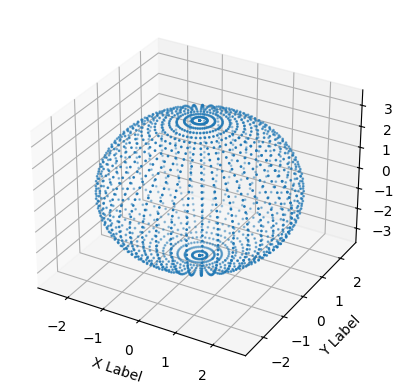

In [9]:
#Uncomment if you want to plot the 3D locations
# Check the points are part of a cylinder
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

m = 'o'
ax.scatter(xs, ys, zs, marker=m, s = 1)

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()

# 3D Plotting: Choose the frequency to plot and calculate the displacements

The `wsort` array below contains the sorted eigenvalues of the resonant frequencies from the minimum to the maximum from index 6 onwards.  The cell below prints a list of the indices of the resonant frequencies calculated.  

In [10]:
#@title Indices and their frequencies
print('index, Resonant_Frequency (Hz)')
for index in range(6, len(wsort)):
    pos = numpy.where(EIGVALS == wsort[index])[0] # Find the frequency from its index
    #print('Indices where wsort equals the frequency: ', pos)
    frequency = 1e5*numpy.sqrt(EIGVALS[pos[0]])/(2*numpy.pi)
    print(index, f' , {frequency:8.2f} Hz')

index, Resonant_Frequency (Hz)
6  ,   448.23 Hz
7  ,   458.85 Hz
8  ,   458.85 Hz
9  ,   523.55 Hz
10  ,   550.37 Hz
11  ,   550.37 Hz
12  ,   594.84 Hz
13  ,   594.84 Hz
14  ,   607.25 Hz
15  ,   607.25 Hz
16  ,   717.95 Hz
17  ,   736.35 Hz
18  ,   736.35 Hz
19  ,   783.13 Hz
20  ,   783.13 Hz
21  ,   786.92 Hz
22  ,   818.36 Hz
23  ,   818.36 Hz
24  ,   836.38 Hz
25  ,   836.38 Hz
26  ,   846.28 Hz
27  ,   846.28 Hz
28  ,   895.67 Hz
29  ,   895.67 Hz
30  ,   915.01 Hz
31  ,   917.29 Hz
32  ,   917.29 Hz
33  ,   964.93 Hz
34  ,   982.90 Hz
35  ,   982.90 Hz
36  ,  1010.73 Hz
37  ,  1016.83 Hz
38  ,  1016.83 Hz
39  ,  1038.59 Hz
40  ,  1038.59 Hz
41  ,  1062.41 Hz
42  ,  1062.41 Hz
43  ,  1105.46 Hz
44  ,  1105.46 Hz
45  ,  1110.33 Hz
46  ,  1110.33 Hz
47  ,  1113.19 Hz
48  ,  1113.19 Hz
49  ,  1161.17 Hz
50  ,  1161.17 Hz
51  ,  1167.68 Hz
52  ,  1195.88 Hz
53  ,  1195.88 Hz
54  ,  1206.21 Hz
55  ,  1209.60 Hz
56  ,  1209.60 Hz
57  ,  1221.28 Hz
58  ,  1221.28 Hz
59  ,  1229.69 Hz
6

In [16]:
%%time
index_of_frequency = 16 # Choose an index value from the list above.
pos = numpy.where(EIGVALS == wsort[index_of_frequency])[0] # Choose a frequency to plot and find its indices!!!
print('Indices where wsort equals the frequency: ', pos)
frequencies = 1e5*numpy.sqrt(EIGVALS[pos])/(2*numpy.pi)
print('Frequencies: ', frequencies)
resonant_frequency = frequencies[0]

DU = numpy.zeros((len(locations),3))
i = 0
for loc in locations:
    dx, dy, dz = u_i(z, [loc[0], loc[1], loc[2]], [pos[0]]) # pos: use all positions, otherwise choose a particular one (e.g. [pos[3]])
    du=numpy.array([dx,dy,dz])
    #du_n = du/numpy.linalg.norm(du)
    DU[i,0] = du[0]
    DU[i,1] = du[1]
    DU[i,2] = du[2]
    i+=1

DU = numpy.array(DU)

Indices where wsort equals the frequency:  [127]
Frequencies:  [717.94673107]
CPU times: user 3.65 s, sys: 8.3 ms, total: 3.66 s
Wall time: 3.67 s


# Plot the magnitude of displacements over the surface of the cylinder

In [17]:
#%matplotlib qt
#%matplotlib inline
displacements = locations + 1.0*DU
xs = displacements[:,0]
ys = displacements[:,1]
zs = displacements[:,2]

abs_displacement = numpy.sqrt(DU[:, 0]**2 + DU[:, 1]**2 + DU[:, 2]**2)

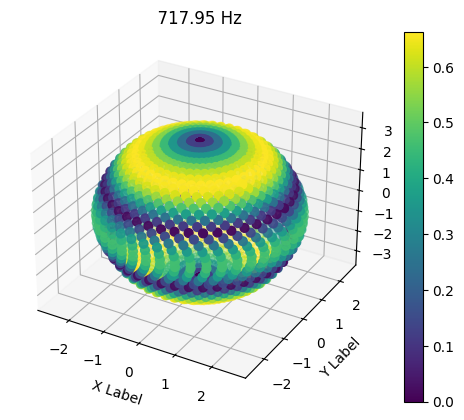

In [18]:
#Uncomment this cell if you want to make a 3D scatter plot using matplotlib
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

m = 'o'
p = ax.scatter(xs, ys, zs, marker=m, s = 40, c = abs_displacement)

ax.set_title(f'{resonant_frequency:8.2f} Hz')
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

fig.colorbar(p)
plt.show()

In [19]:
# Uncomment this cell for an individual 3d plot with no animations
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x=xs,
    y=ys,
    z=zs,
    mode='markers',
    marker=dict(
        size=12,
        color=numpy.sqrt(DU[:,0]**2 + DU[:,1]**2 + DU[:,2]**2),                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=1.0,
        colorbar=dict(thickness=20)
    )
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0),
                  # Remove axes from scene (comment this scene property if you want to see the axes)
                  scene = dict(
                      xaxis = dict(visible=False),
                      yaxis = dict(visible=False),
                      zaxis =dict(visible=False)
                      )
                  )
fig.show()

# Animate the movement

The displacements can be animated by assuming the resonant vibration is a complex exponential multiplied for each displacement amplitude at the locations on the surface of the shape.  The cell below shows five cycles of oscillation of the resonant mode.  The locations are coloured using the absolute value of the amplitude of the displacement vector.

In [20]:
import plotly.graph_objects as go

# Assuming xs, ys, zs, resonant_frequency, and DU are defined from the previous code

T_r = 1/resonant_frequency # Period of the resonant frequency
time = numpy.linspace(0, 5*T_r, 100)  # Time from 0 to 5*T_r

frames = []
for t in time:
    complex_exp = numpy.exp(1j * resonant_frequency * 2 * numpy.pi * t)
    new_xs = locations[:,0] + 1.0*DU[:,0] * complex_exp.real
    new_ys = locations[:,1] + 1.0*DU[:,1] * complex_exp.real
    new_zs = locations[:,2] + 1.0*DU[:,2] * complex_exp.real

    frame = go.Frame(data=[go.Scatter3d(x=new_xs, y=new_ys, z=new_zs,
                                        mode='markers',
                                        marker=dict(
                                            size=8,
                                            color=abs_displacement,
                                            colorscale='Viridis',
                                            opacity=1.0
                                        ))],
                     name=str(t))
    frames.append(frame)

fig = go.Figure(
    data=[go.Scatter3d(x=locations[:,0], y=locations[:,1], z=locations[:,2], mode='markers',
                       marker=dict(size=8, color=abs_displacement,
                                   colorscale='Viridis', opacity=1.0))],
    frames=frames
)

fig.update_layout(
    title=f'{resonant_frequency:8.2f} Hz',
    updatemenus=[dict(
        type="buttons",
        buttons=[dict(label="Play",
                      method="animate",
                      args=[None, {"frame": {"duration": 5, "redraw": True},
                                   "transition": {"duration": 0},
                                   "fromcurrent": True,
                                   "mode": "immediate"
                                   }]),
                 dict(label="Pause",
                      method="animate",
                      args=[[None], {"frame": {"duration": 0, "redraw": False},
                                     "mode": "immediate",
                                     "transition": {"duration": 0}}])
                 ])],
    # Remove axes from scene
    scene = dict(
        xaxis = dict(visible=False),
        yaxis = dict(visible=False),
        zaxis =dict(visible=False)
        )
    )

scene = {
    # ...
    'aspectmode': 'cube',
}

fig.show()

# References

- Visscher, W. M., Migliori, A., Bell, T. M., & Reinert, R. A. (1991). On the normal modes of free vibration of inhomogeneous and anisotropic elastic objects. The Journal of the Acoustical Society of America, 90(4), 2154-2162.
- Migliori, A., Sarrao, J. L., Visscher, W. M., Bell, T. M., Lei, M., Fisk, Z., & Leisure, R. G. (1993). Resonant ultrasound spectroscopic techniques for measurement of the elastic moduli of solids. Physica B: Condensed Matter, 183(1-2), 1-24.
- de Rue, J. (1996). On the normal modes of freely vibrating elastic objects of various shapes (MSc thesis, University of Amsterdam).
- Zadler, B. J., Le Rousseau, J. H., Scales, J. A., & Smith, M. L. (2004). Resonant ultrasound spectroscopy: theory and application. Geophysical Journal International, 156(1), 154-169.